
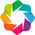

In [1]:
import numpy as np
import pandas as pd
import  pypostpiv as ppv
import holoviews as hv
import bokeh
hv.extension('bokeh')
from holoviews.plotting.bokeh.element import (line_properties, fill_properties,
                                              text_properties)

In [2]:
from bokeh.models import HoverTool
hover = HoverTool(tooltips=[("index", "$index")])

In [3]:
ppv.utilities.convert_2d_2c_vc7('./test1/', './test1.h5')
example = ppv.piv.Project2D2C('./test1.h5')

In [4]:
example.list_data()

cam_1
----velocity
--------y
--------x
--------u
--------v
----grid_size
--------dx
--------dy
cam_0
----velocity
--------y
--------x
--------u
--------v
----grid_size
--------dx
--------dy


In [8]:
%opts Image [tools=['hover', 'crosshair']]
(nx, ny, ntime) = example.data['cam_1']['velocity']['u'].shape
(dx, dy, dtime) = (example.data['cam_1']['grid_size']['dx'],
                   example.data['cam_1']['grid_size']['dy'],
                   1.0)
x = dx*np.arange(nx)
y = dy*np.arange(ny)
time = dtime*np.arange(ntime)
u = example.data['cam_1']['velocity']['v']
u_magnitude_ds = hv.Dataset(
    (time, y, x, u),
    kdims=['time', 'y', 'x'], vdims=['U Velocity Component'])

hv.Image.opts
image = u_magnitude_ds.to(hv.Image, ['x', 'y'])

image

:HoloMap   [time]
   :Image   [x,y]   (U Velocity Component)

In [6]:
%opts Image
obs_hmap = hv.HoloMap(u_magnitude_ds.to(hv.Image, ['x', 'y']))
obs_hmap

:HoloMap   [time]
   :Image   [x,y]   (U Velocity Component)

In [49]:
u_f = u.flatten()

In [52]:
x_df = np.linspace(0,256,256)
y_df = np.tile(x_df,256)
x_df = np.repeat(x_df,256)

In [40]:
v_df = []
for i in range(0,256):
    for j in range(0,256):
        v_df.append(u[i,j])

In [53]:
arr_t = []
for i in range(1,11):
    ar = np.zeros(66536)+ i
    arr_t.append(ar)
arr_t = np.asarray(arr_t)
arr_t = arr_t.flatten()
x_df

array([   0.,    0.,    0., ...,  256.,  256.,  256.])

In [ ]:
d = {'x': x_df, 'y': y_df, 'Velocity': v_df}
index = np.linspace(0,65535,65536)
df = pd.DataFrame(data = d, index = index)